# 러프 실험

In [1]:
import torch
from diffusers import StableDiffusionPipeline
from diffusers.loaders import AttnProcsLayers
from PIL import Image
import os

/home/pr3_id1/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [3]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    safety_checker=None
).to(device)

Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  3.51it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [4]:
from ip_adapter import IPAdapter

ip_adapter = IPAdapter(
    pipe,
    image_encoder_path="laion/CLIP-ViT-H-14-laion2B-s32B-b79K",
    ip_ckpt="ip-adapter_sd15.bin",
    device=device
)

In [5]:
ref_image = Image.open("food1.jfif").convert("RGB")

In [6]:
prompt = (
    "This is an advertisement poster for a Korean food. "
    "Use the reference image as the main visual. "
    ""
)

In [7]:
negative_prompt = (
    "blurry, text artifacts, low resolution, extra fingers, distorted layout, watermark, "
    "bad anatomy, overexposed, logo error, low contrast"
)

In [8]:

image = ip_adapter.generate(
    prompt=prompt,
    pil_image=ref_image,
    negative_prompt=negative_prompt,
    scale=0.8,
    num_inference_steps=30,
    guidance_scale=7.5,
)

100%|██████████| 30/30 [00:06<00:00,  4.29it/s]


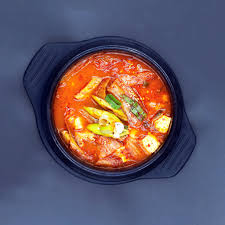

In [9]:
ref_image

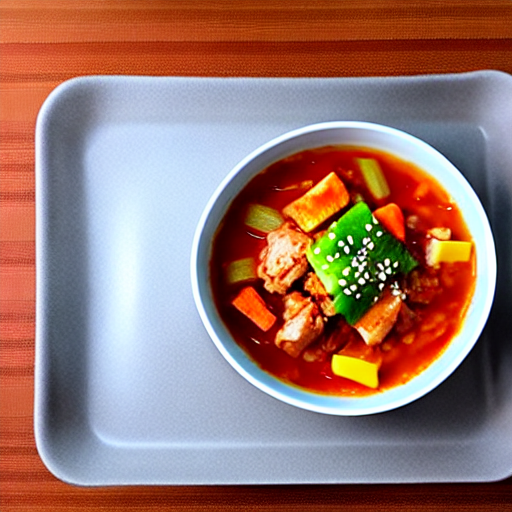

(512, 512)


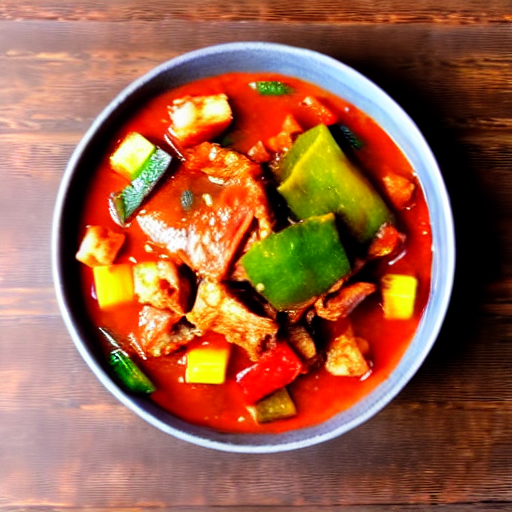

(512, 512)


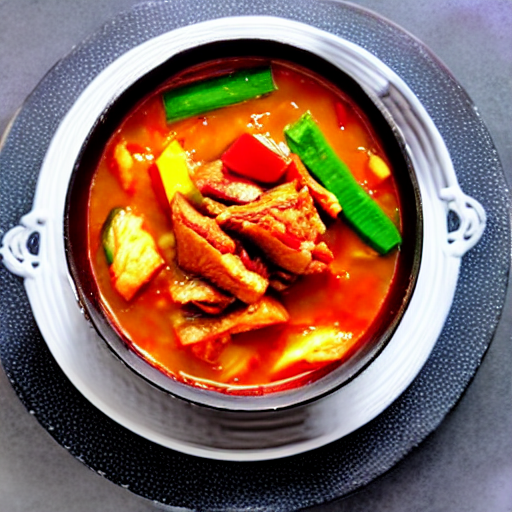

(512, 512)


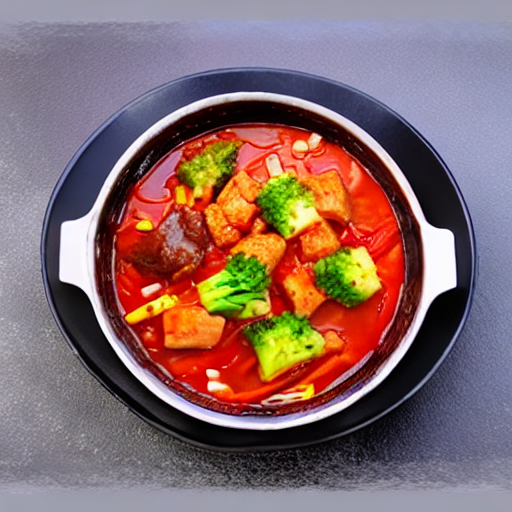

(512, 512)


In [10]:
for img in image:
    display(img)
    print(img.size)

In [12]:
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline
from diffusers.utils import load_image
from controlnet_aux import CannyDetector

In [13]:
input_image = Image.open("food1.jfif").convert("RGB").resize((512, 512))

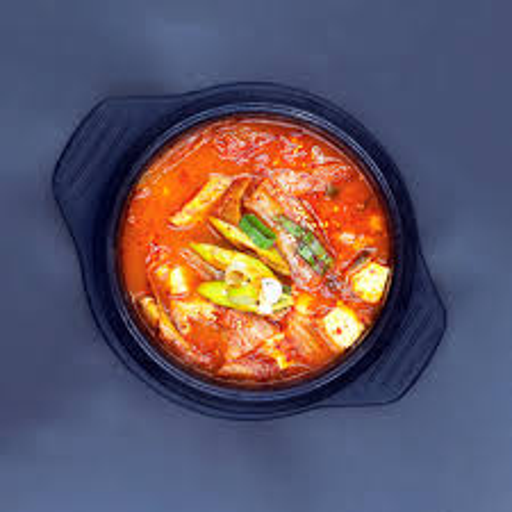

In [14]:
input_image

In [15]:
canny_detector = CannyDetector()
control_image = canny_detector(input_image)

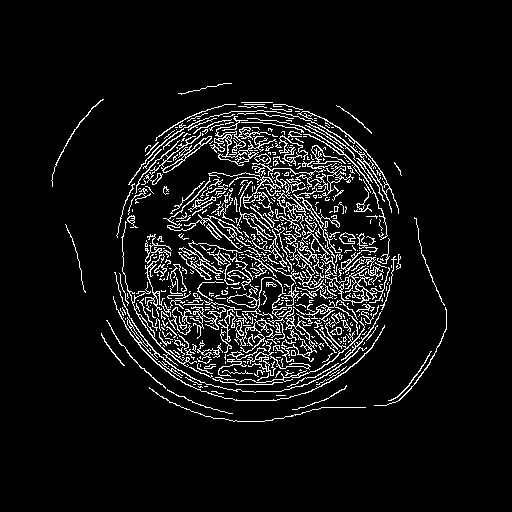

In [16]:
control_image

In [17]:
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
)

In [18]:
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  3.04it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [19]:
prompt = "A Korean food advertisement poster with warm color tone, wooden texture, Korean food product"

In [20]:
negative_prompt = "blurry, distorted, unrealistic, watermark"

In [21]:
result = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=control_image,
    guidance_scale=7.5,
    num_inference_steps=30,
    controlnet_conditioning_scale=1.0
)

100%|██████████| 30/30 [00:02<00:00, 10.41it/s]


In [22]:
for res in result:
    display(result)

StableDiffusionPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=512x512 at 0x78BF54381750>], nsfw_content_detected=None)

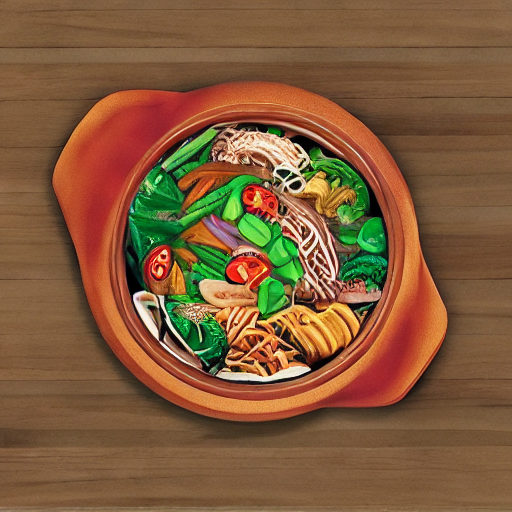

In [23]:
result.images[0]

In [24]:
import os
import base64
from PIL import Image
from dotenv import load_dotenv
from openai import OpenAI
import torch
from diffusers import StableDiffusionPipeline

In [25]:
# 환경변수 로드 및 OpenAI 클라이언트 설정

load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")
client = OpenAI(api_key=api_key)

In [26]:
# 2. 이미지 인코딩 (base64)
def encode_image(image_path):
    with open(image_path, "rb") as f:
        return base64.b64encode(f.read()).decode('utf-8')

In [40]:
# 3. GPT Vision을 사용한 광고 배경용 프롬프트 생성
def generate_prompt_from_image(product_image_path, ad_reference_image_path=None, product_type=None):
    product_base64 = encode_image(product_image_path)
    if ad_reference_image_path:
        reference_base64 = encode_image(ad_reference_image_path)

    response = client.chat.completions.create(
        model="gpt-4.1-mini",
        messages=[
            {
                "role": "system",
                "content": (
                    "You are an AI assistant that writes background-only prompts for product banner ads regards to given images.\n"
                    "Input:\n"
                    "- A product image (e.g. cosmetics, food)\n"
                    "- Optionally, a reference banner image showing preferred layout or style\n\n"
                    "Output:\n"
                    "Write a single English prompt for Stable Diffusion describing only the background with in 70 characters.\n\n"
                    "Guidelines:\n"
                    "- Do NOT include the product in the prompt\n"
                    "- Focus on background design: colors, lighting, textures, mood, layout\n"
                    "- Follow front-facing or top-down perspective if visible in reference\n"
                    "- No furniture, food, text, logos, or distracting objects unless clearly present in the reference\n"
                    "- Favor minimal, clean design that makes the product stand out when overlaid\n"
                    "- Leave visual space for product and UI elements\n"
                    "- Keep it simple, elegant, and ad-appropriate"
                )
            },
            {
                "role": "user",
                "content": [
                    {
                        "type": "text",
                        "text": (
                            f"Generate a background-only prompt for a banner ad. "
                            f"The background should be suitable for a product of type: '{product_type}'. "
                            f"Use the following product image and optional reference banner layout."
                        )
                    },
                    {
                        "type": "image_url",
                        "image_url": {"url": f"data:image/png;base64,{product_base64}"}
                    },
                    {
                        "type": "image_url",
                        "image_url": {"url": f"data:image/png;base64,{reference_base64}"}
                    } if ad_reference_image_path else {}
                ]
            }
        ],
        max_tokens=300
    )

    return response.choices[0].message.content.strip()

In [41]:
# 4. Stable Diffusion 초기화
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None
).to(device)

Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00,  6.01it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [42]:
# 5. 프롬프트 기반 배경 생성
def generate_background(prompt, output_path="./background.png"):
    print(f"🎨 배경 이미지 생성 중...\nPrompt: {prompt}")
    result = pipe(prompt=prompt)

    image = result.images[0]
    # image.save(output_path)
    # print(f"✅ 배경 이미지 저장 완료: {output_path}")
    return image

In [43]:
product_image_path = "food2.jfif"
ad_reference_image_path = "image.png"

In [44]:
prompt = generate_prompt_from_image(product_image_path, ad_reference_image_path)
print(prompt)

Warm, rustic restaurant interior with soft lighting and wooden textures


🎨 배경 이미지 생성 중...
Prompt: Warm, rustic restaurant interior with soft lighting and wooden textures


100%|██████████| 50/50 [00:03<00:00, 15.35it/s]


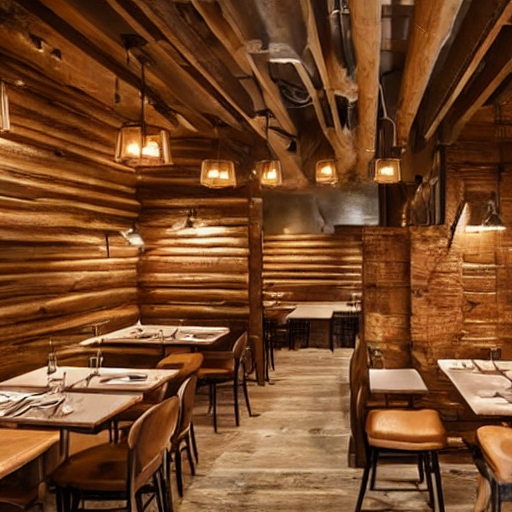

🎨 배경 이미지 생성 중...
Prompt: Warm, rustic restaurant interior with soft lighting and wooden textures


100%|██████████| 50/50 [00:03<00:00, 15.32it/s]


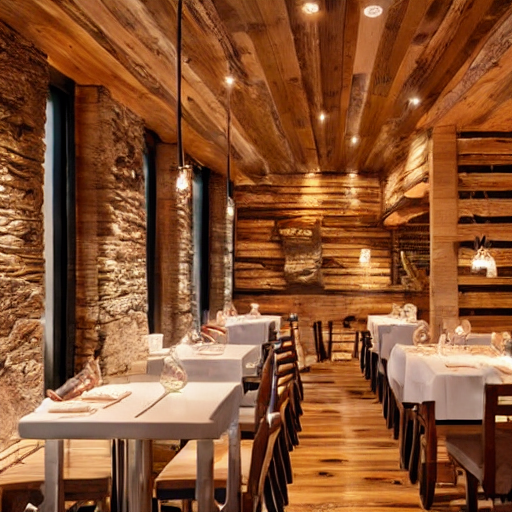

🎨 배경 이미지 생성 중...
Prompt: Warm, rustic restaurant interior with soft lighting and wooden textures


100%|██████████| 50/50 [00:03<00:00, 15.26it/s]


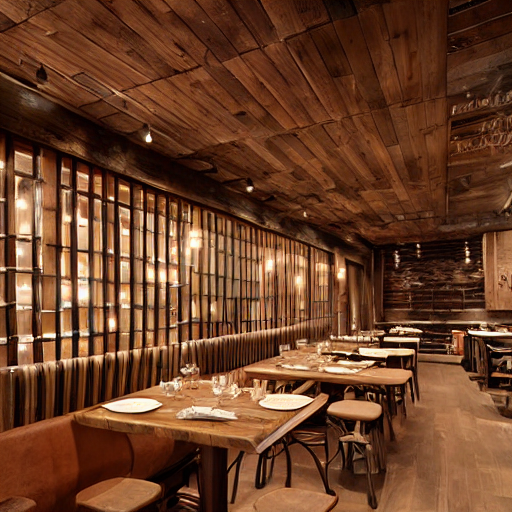

🎨 배경 이미지 생성 중...
Prompt: Warm, rustic restaurant interior with soft lighting and wooden textures


100%|██████████| 50/50 [00:03<00:00, 15.19it/s]


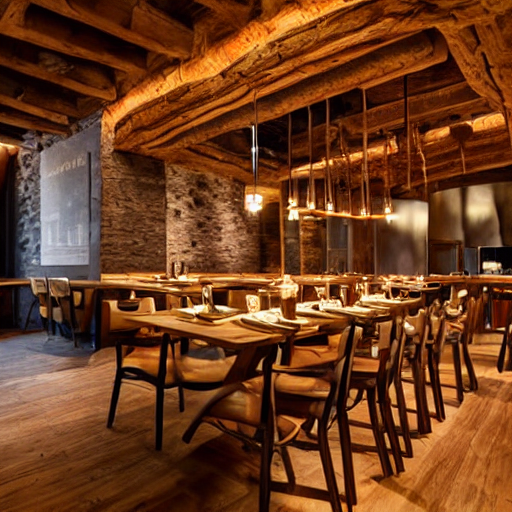

In [45]:
 # Step 2: 배경 이미지 생성
gen_sample = 4
results = []

for _ in range(gen_sample):
    background_img = generate_background(prompt)
    background_img.show()
    results.append(background_img)

In [46]:
from rembg import remove
import io

In [47]:
def remove_background(image_path):
    with open(image_path, 'rb') as f:
        input_data = f.read()

    output_data = remove(input_data)
    return Image.open(io.BytesIO(output_data))

In [48]:
product_img = remove_background("3535972.jpg")

In [49]:
product_img.save("product_img.png")

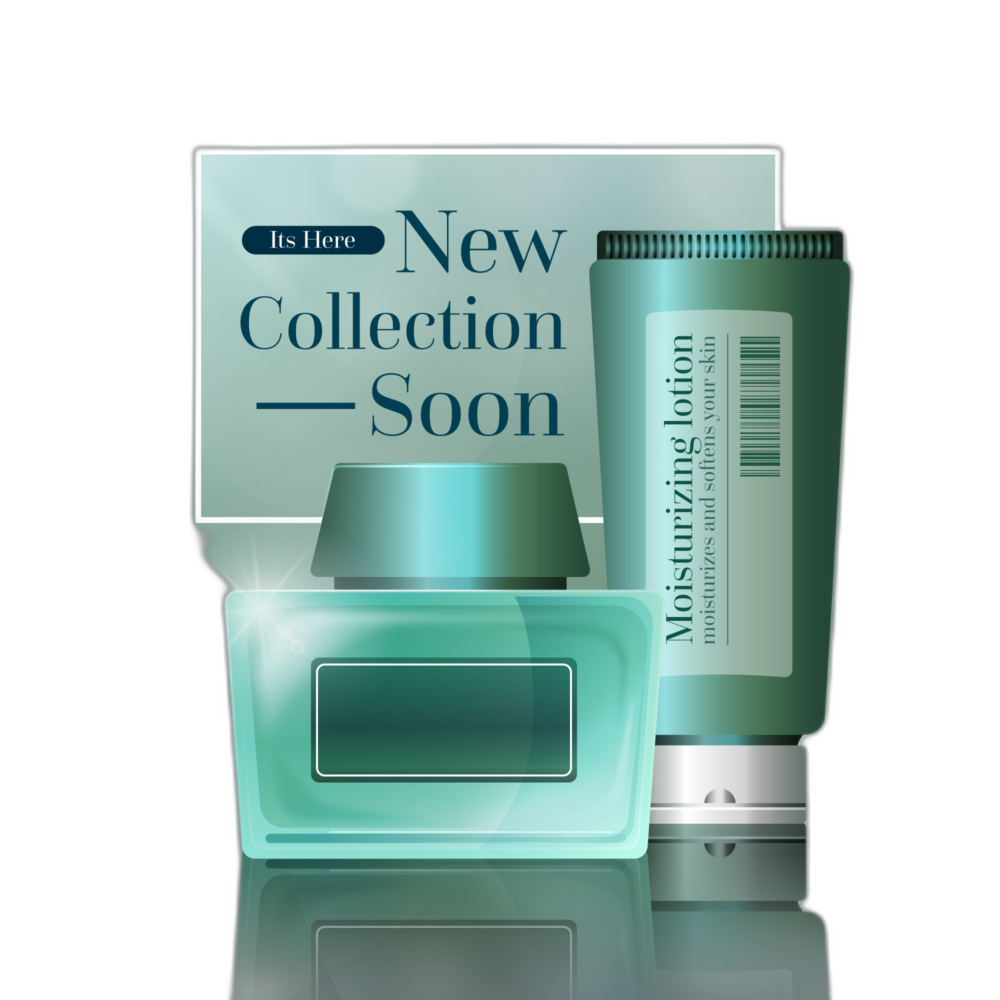

In [50]:
product_img

In [51]:
prompt = generate_prompt_from_image("product_img.png", ad_reference_image_path, "Moisturizing Lotion")

In [52]:
print(prompt)

Soft gradient teal and aqua background with smooth subtle light reflections, minimal and clean, elegant and fresh atmosphere, front-facing layout with negative space on left for text and product display.


In [53]:
background_img = generate_background(prompt)

🎨 배경 이미지 생성 중...
Prompt: Soft gradient teal and aqua background with smooth subtle light reflections, minimal and clean, elegant and fresh atmosphere, front-facing layout with negative space on left for text and product display.


100%|██████████| 50/50 [00:03<00:00, 15.25it/s]


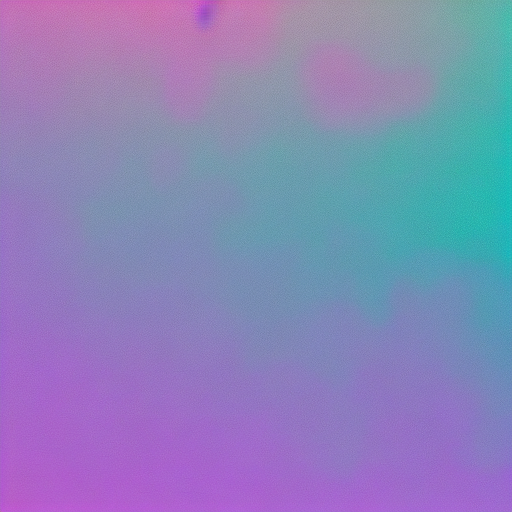

In [54]:
background_img

# Refactoring

In [1]:
import os
import base64
import io
from PIL import Image
from dotenv import load_dotenv
from openai import OpenAI
import torch
from diffusers import StableDiffusionPipeline

/home/pr3_id1/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from rembg import remove

## Initializing Env settings and model

In [3]:
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")
client = OpenAI(api_key=api_key)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None
).to(device)

Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  3.93it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [4]:
## Utils

def encode_image(image_path):
    with open(image_path, "rb") as f:
        return base64.b64encode(f.read()).decode('utf-8')

def remove_background(image_path):
    with open(image_path, 'rb') as f:
        input_data = f.read()
    output_data = remove(input_data)
    return Image.open(io.BytesIO(output_data))

## Prompt Generation

In [5]:
def generate_ad_prompt(product_type: str, marketing_context: str = "") -> str:
    base_prompt = (
        f"Create a clean, minimal background for an advertisement promoting {product_type}. "
        f"Use warm tones and leave ample space for text and product placement. "
        f"Design should feel inviting, professional, and suitable for print or digital media."
    )
    if marketing_context:
        base_prompt += f" The ad context: {marketing_context}."
    base_prompt += " Do NOT include the product image or any text in the background."
    return base_prompt

In [33]:
def generate_prompt_from_image(product_image_path: str, product_type: str, marketing_context: str = "", ad_reference_image_path: str = None) -> str:
    try:
        product_base64 = encode_image(product_image_path)
        reference_base64 = encode_image(ad_reference_image_path) if ad_reference_image_path else None

        messages = [
            {
                "role": "system",
                "content": (
                    "Write a prompt to generate a clean background-only image for a product ad.\n"
                    "Focus on mood, setting, and color. Leave space for product placement.\n"
                    "If unclear, create a soft, neutral, object-free background.\n"
                    "generated prompt should be within 77 tokens"
                )
                            },
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": generate_ad_prompt(product_type, marketing_context)},
                    {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{product_base64}"}},
                ] + ([{ "type": "image_url", "image_url": {"url": f"data:image/png;base64,{reference_base64}" }}] if reference_base64 else [])
            }
        ]

        response = client.chat.completions.create(
            model="gpt-4.1-nano",
            messages=messages,
            max_tokens=300
        )

        return response.choices[0].message.content.strip()

    except Exception as e:
        raise RuntimeError(f"프롬프트 생성 실패: {e}")

In [34]:
def generate_korean_ad_copy(product_type: str) -> str:
    try:
        messages = [
            {
                "role": "system",
                "content": (
                    "당신은 한국어 광고 문구를 작성하는 카피라이터입니다."
                    "사용자가 지정한 제품의 종류에 따라 소상공인이 사용할 수 있는 짧고 임팩트 있는 광고 문구를 한 문장으로 작성하세요."
                    "너무 일반적이거나 진부하지 않게, 제품의 장점을 부각하는 형태로 작성해 주세요."
                )
            },
            {
                "role": "user",
                "content": f"'{product_type}' 제품을 위한 한국어 광고 문구를 작성해줘."
            }
        ]

        response = client.chat.completions.create(
            model="gpt-4.1-nano",
            messages=messages,
            max_tokens=100
        )

        return response.choices[0].message.content.strip()

    except Exception as e:
        raise RuntimeError(f"광고 문구 생성 실패: {e}")

## Background Image Generation

In [35]:
def generate_background(prompt: str, output_path: str = None) -> Image.Image:
    try:
        result = pipe(prompt=prompt, negative_prompt="Do NOT describe the product. Do NOT include any text, letters, logos, or devices.\n")
        image = result.images[0]
        if output_path:
            image.save(output_path)
        return image
    except Exception as e:
        raise RuntimeError(f"배경 이미지 생성 실패: {e}")

## Run

In [36]:
def create_ad_background(
    product_img_path: str,
    product_type: str,
    marketing_context: str = "",
    reference_img_path: str = None,
    save_path: str = None
) -> dict:
    try:
        product_img = remove_background(product_img_path)
        temp_product_path = "temp_removed.png"
        product_img.save(temp_product_path)

        prompt = generate_prompt_from_image(temp_product_path, product_type, marketing_context, reference_img_path)
        print(prompt)
        background_img = generate_background(prompt, output_path=save_path)
        ad_copy = generate_korean_ad_copy(product_type)

        return {
            "prompt": prompt,
            "background_image": background_img,
            "ad_copy_ko": ad_copy
        }

    except Exception as e:
        return {"error": str(e)}

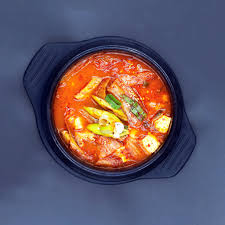

In [37]:
sample_img = "food1.jfif"

with open(sample_img, 'rb') as f:
    img_1 = Image.open(f)
    img_1.show()

In [38]:
# results = create_ad_background(
#     'food2.jfif',
#     'food',
#     'image.png',
#     'saved_image.png'
# )
results = create_ad_background(
    product_img_path='food1.jfif',
    product_type="Korean food",
    marketing_context="한식 김치찌개 홍보 배너",
    reference_img_path="ad_image.jfif",
    save_path="result_banner.png"
)

A clean, minimal background featuring warm beige and soft cream tones, with subtle gradient shading to evoke warmth and comfort. The background is neutral and inviting, with ample space in the center for text and product placement, perfect for a Korean food advertisement. The design feels professional, calm, and suitable for print or digital media.


100%|██████████| 50/50 [00:03<00:00, 15.42it/s]


In [39]:
results

{'prompt': 'A clean, minimal background featuring warm beige and soft cream tones, with subtle gradient shading to evoke warmth and comfort. The background is neutral and inviting, with ample space in the center for text and product placement, perfect for a Korean food advertisement. The design feels professional, calm, and suitable for print or digital media.',
 'background_image': <PIL.Image.Image image mode=RGB size=512x512>,
 'ad_copy_ko': '진짜 맛의 비밀, 전통의 깊이를 느끼세요!'}

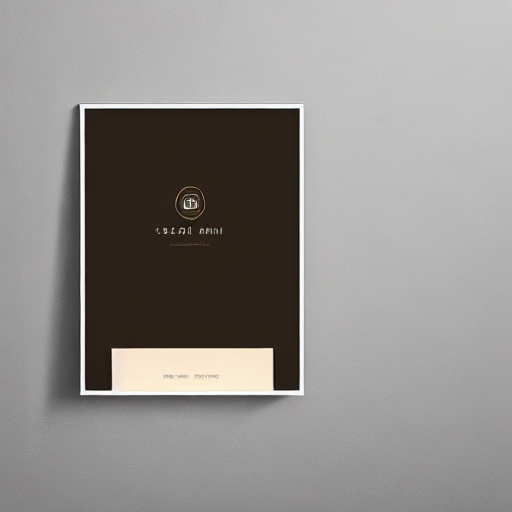

In [40]:
results['background_image']

In [32]:
results['ad_copy_ko']

'한국의 진짜 맛을 집에서도, 한입에 느껴지는 전통의 깊이!'

In [84]:
def create_ad_with_ip_adapter(
    user_img_path: str,
    product_type: str,
    marketing_context: str
) -> Image.Image:
    prompt = (
        f"An advertisement banner for {product_type}. "
        f"The ad is intended for: {marketing_context}. "
        f"Use the uploaded image as main visual. Place it centered, add space for text above. "
        f"Clean, modern design with a focus on warmth and local charm."
    )
    negative_prompt = (
        "blurry, distorted, watermark, low quality, overexposed"
    )

    ref_img = Image.open(user_img_path).convert("RGB")
    return ip_adapter.generate(
        prompt=prompt,
        pil_image=ref_img,
        negative_prompt=negative_prompt,
        scale=0.6,
        guidance_scale=9
    )

In [85]:
def create_ad(
    user_img_path: str,
    product_type: str,
    marketing_context: str,
    mode: str = "background"  # or "ip_adapter"
):
    if mode == "background":
        return create_ad_background(
            product_img_path=user_img_path,
            product_type=product_type,
            marketing_context=marketing_context
        )
    elif mode == "ip_adapter":
        return {
            "generated_image": create_ad_with_ip_adapter(
                user_img_path, product_type, marketing_context
            )
        }

In [ ]:
gen_ad = create_ad(
            user_img_path="food1.jfif",
            product_type="Korean food",
            marketing_context="한식 김치찌개 홍보 배너",
            mode="ip_adapter"  # or "ip_adapter"
        )

Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  4.45it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
100%|██████████| 30/30 [00:06<00:00,  4.41it/s]


In [42]:
gen_ad

{'generated_image': [<PIL.Image.Image image mode=RGB size=512x512>,
  <PIL.Image.Image image mode=RGB size=512x512>,
  <PIL.Image.Image image mode=RGB size=512x512>,
  <PIL.Image.Image image mode=RGB size=512x512>]}

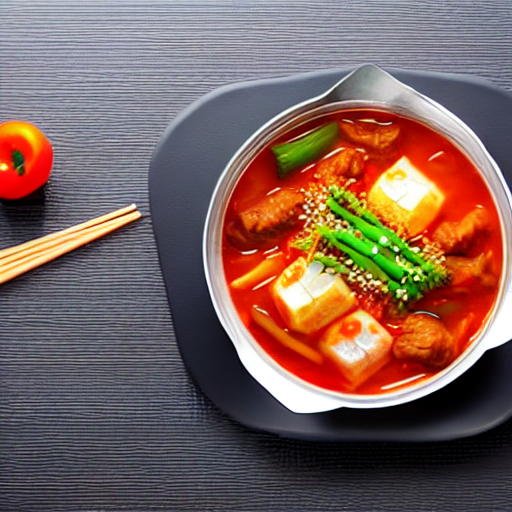

In [53]:
gen_ad['generated_image'][0]

In [2]:
gen_ad = create_ad_background(
    product_img_path='food1.jfif',
    product_type='Korean Food',
    marketing_context = "김치찌개 홍보 배너",
    reference_img_path = 'ad_image.jfif',
    save_path = 'save_temp.png'
) 

Token indices sequence length is longer than the specified maximum sequence length for this model (91 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['. do not put the product image , nor the text in the image']
100%|██████████| 50/50 [00:03<00:00, 14.16it/s]


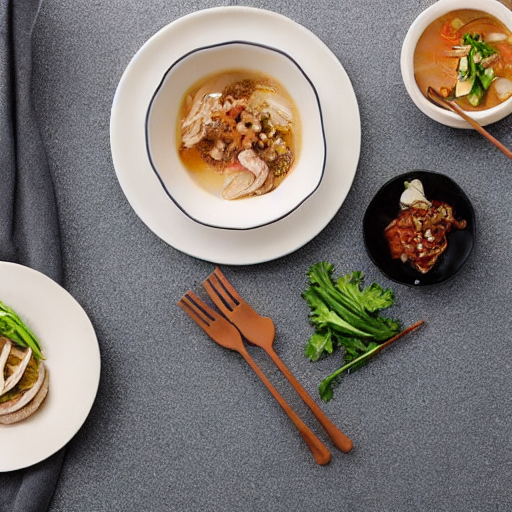

In [3]:
gen_ad['background_image']

In [4]:
gen_ad['prompt']

'A clean, minimal background featuring warm beige and soft amber tones, with a subtle gradient to create a inviting and cozy atmosphere. The design is spacious, with plenty of empty space in the center, ideal for text and product placement. The overall mood is professional, warm, and welcoming, suitable for print or digital promotion of Korean food, specifically 김치찌개.Do not put the product image, Nor the Text in the image'